# Optimization Algorithms on a Non-Convex Function
I applied the optimization algorithms on a more sophisticated function (Styblinski-Tang Function).

In [1]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
import numpy as np
import os
import time
import math

## The Styblinski-Tang function is given by - 
 
# $f(\mathbf{x})=\frac{1}{2} \sum_{i=1}^d\left(x_i^4-16 x_i^2+5 x_i\right)$

<b>This function has 3 local minima and 1 global minima.</b>

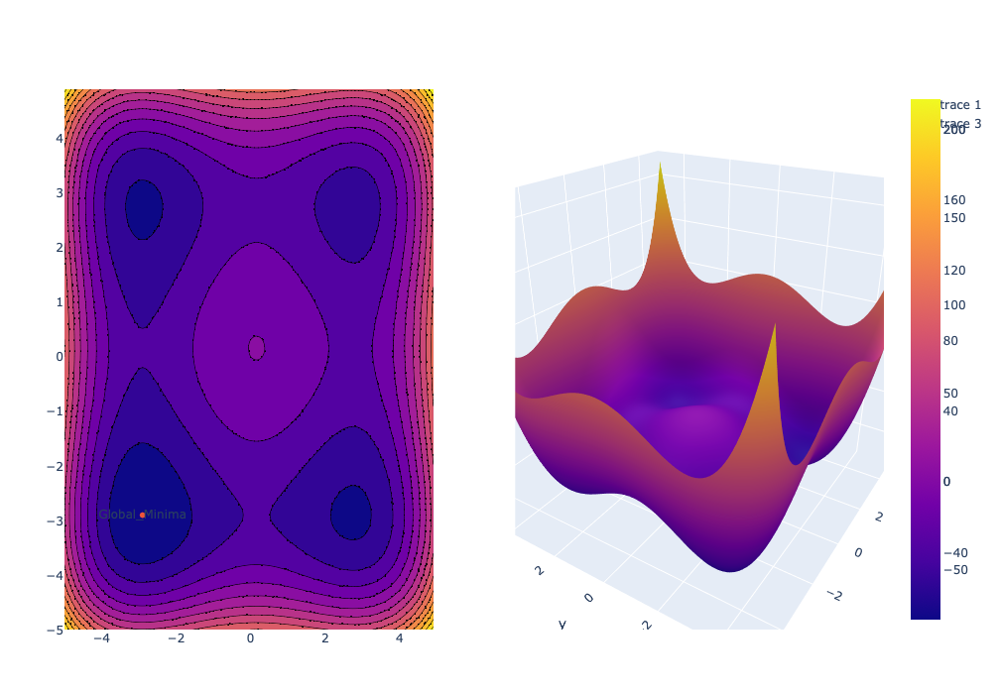

In [44]:
x_plot = np.arange(-5, 5, 0.1)
y_plot = np.arange(-5, 5, 0.1)
X_plot, Y_plot = np.meshgrid(x_plot, y_plot)
Z_plot = 0.5*((X_plot**4)-(16*X_plot**2)+(5*X_plot)+(Y_plot**4)-(16*Y_plot**2)+(5*Y_plot))

fig = make_subplots(rows=1, cols=2, specs=[[{'type':'contour'}, {'type':'surface'}]])
contour = fig.add_trace(go.Contour(x=x_plot, y=y_plot, z=Z_plot), row=1, col=1)
contour.add_scatter(x=(-2.903534,), y=(-2.903534,), text="Global_Minima", mode='markers+text')

surface = fig.add_trace(go.Surface(x=X_plot, y=Y_plot, z=Z_plot), row=1, col=2)
surface.add_scatter3d(x=(-2.903534,), y=(-2.903534,), z=(-78.33198,), text="Global_Minima", marker=dict(size=10, color="white"))
camera = dict(
    up=dict(x=0, y=0, z=1),
    center=dict(x=0, y=0, z=0),
    eye=dict(x=0.75, y=0.75, z=1.7)
    )
surface.update_layout(scene_camera=camera)

fig.update_layout(autosize=True,
          width=1400, height=700,
          margin=dict(l=65, r=50, b=65, t=90))

fig.show()

In [3]:
class Model:
    def __init__(self, x_init, y_init):
        self.x_init = x_init
        self.y_init = y_init
        self.model_trained = False
    def compute_cost(self, x, y):
        z = 0.5*((x**4)-(16*x**2)+(5*x)+(y**4)-(16*y**2)+(5*y))
        return z
    def compute_gradient(self, x, y):
        dz_dx = 2*(x**3)-(16*x)+2.5
        dz_dy = 2*(y**3)-(16*y)+2.5
        return dz_dx, dz_dy
    def gradient_descent(self, alpha, num_iters, optimizer, hyperparameters, decay_rate):
        x = self.x_init
        y = self.y_init
        z_hist = []
        x_hist = []
        y_hist = []
        x_hist.append(x)
        y_hist.append(y)
        z_hist.append(self.compute_cost(x, y))
        v_x = 0
        v_y = 0
        s_x = 0
        s_y = 0

        for iter in range(1, num_iters+1):
            alpha_ = alpha/(1+(iter*decay_rate))

            if optimizer=="GD":
                dz_dx, dz_dy = self.compute_gradient(x, y)
                x = x - alpha_*dz_dx
                y = y - alpha_*dz_dy
            elif optimizer=="Momentum":
                beta = hyperparameters[0]
                dz_dx, dz_dy = self.compute_gradient(x, y)
                v_x = (beta*v_x) + (alpha_*dz_dx)
                v_y = (beta*v_y) + (alpha_*dz_dy)
                x = x - v_x
                y = y - v_y
            elif optimizer=="NAG":
                beta = hyperparameters[0]
                x_la = x - (beta*v_x)
                y_la = y - (beta*v_y)
                dz_dx_la, dz_dy_la = self.compute_gradient(x_la, y_la)
                v_x = (beta*v_x) + (alpha_*dz_dx_la)
                v_y = (beta*v_y) + (alpha_*dz_dy_la)
                x = x - v_x
                y = y - v_y
            elif optimizer=="AdaGrad":
                E = hyperparameters[0]
                dz_dx, dz_dy = self.compute_gradient(x, y)
                v_x = v_x + (dz_dx**2)
                v_y = v_y + (dz_dy**2)
                x = x - ((alpha_/(np.sqrt(v_x)+E))*dz_dx)
                y = y - ((alpha_/(np.sqrt(v_y)+E))*dz_dy)
            elif optimizer=="RMSprop":
                beta, E = hyperparameters
                dz_dx, dz_dy = self.compute_gradient(x, y)
                s_x = (beta*s_x) + (1-beta)*(dz_dx**2)
                s_y = (beta*s_y) + (1-beta)*(dz_dy**2)
                x = x - ((alpha_/(np.sqrt(s_x)+E))*dz_dx)
                y = y - ((alpha_/(np.sqrt(s_y)+E))*dz_dy)
            elif optimizer=="Adam":
                t = iter
                beta1, beta2, E = hyperparameters
                dz_dx, dz_dy = self.compute_gradient(x, y)
                v_x = (beta1*v_x) + (1-beta1)*(dz_dx)
                v_y = (beta1*v_y) + (1-beta1)*(dz_dy)
                s_x = (beta2*s_x) + (1-beta2)*(dz_dx**2)
                s_y = (beta2*s_y) + (1-beta2)*(dz_dy**2)
                v_x_c = v_x/(1-(beta1**t))
                v_y_c = v_y/(1-(beta1**t))
                s_x_c = s_x/(1-(beta2**t))
                s_y_c = s_y/(1-(beta2**t))
                x = x - ((alpha_/(np.sqrt(s_x_c)+E))*v_x_c)
                y = y - ((alpha_/(np.sqrt(s_y_c)+E))*v_y_c)
                
            x_hist.append(x)
            y_hist.append(y)
            z = self.compute_cost(x, y)
            z_hist.append(z)
            if iter% math.ceil(num_iters/10) == 0 or iter == (num_iters-1):
                print(f"At iteration {str(iter)}:")
                print(f"\t z: {str(z)}")
                print(f"\t x: {str(x)}")
                print(f"\t y: {str(y)}")
        return x, y, z, x_hist, y_hist, z_hist

    def fit(self, alpha, num_iters, optimizer, hyperparameters, decay_rate=0):
        start_time = time.time()
        self.x, self.y, self.z, self.x_hist, self.y_hist, self.z_hist = self.gradient_descent(alpha, num_iters, optimizer, hyperparameters, decay_rate)
        end_time = time.time()
        self.training_time = end_time-start_time
        self.model_trained = True
        print(f"Time taken: {self.training_time}")
            
    def plot(self, title, plot_3d=True, plot_hist=False, onwards=None, save_3d=False, save_hist=False):
        x_hist = self.x_hist
        y_hist = self.y_hist
        z_hist = self.z_hist
        if plot_3d:
            x_plot = np.arange(-5, 5, 0.1)
            y_plot = np.arange(-5, 5, 0.1)
            X_plot, Y_plot = np.meshgrid(x_plot, y_plot)
            Z_plot = self.compute_cost(X_plot, Y_plot)
            
            fig = make_subplots(rows=1, cols=2, specs=[[{'type':'contour'}, {'type':'surface'}]])
            contour = fig.add_trace(go.Contour(x=x_plot, y=y_plot, z=Z_plot), row=1, col=1)
            contour.add_scatter(x=x_hist, y=y_hist, marker=dict(size=2, color="white"))
    
            surface = fig.add_trace(go.Surface(x=X_plot, y=Y_plot, z=Z_plot), row=1, col=2)
            surface.add_scatter3d(x=x_hist, y=y_hist, z=z_hist, marker=dict(size=2, color="white"))
            camera = dict(
                up=dict(x=0, y=0, z=1),
                center=dict(x=0, y=0, z=0),
                eye=dict(x=0.75, y=0.75, z=1.7)
                )
            surface.update_layout(scene_camera=camera)
    
            fig.update_layout(title=title, autosize=True,
                      width=1400, height=700,
                      margin=dict(l=65, r=50, b=65, t=90))
            if save_3d:
                path='model_plots/'+title.replace(" ", "_")+"stf_3d.png"
                if os.path.exists(path):
                    os.remove(path)
                fig.write_image(path)
            fig.show()
        
        if plot_hist:
            fig_2 = plt.figure(figsize=(10, 5))
            ax1 = fig_2.add_subplot(121)
            ax1.plot(z_hist)
            ax1.set_title("Cost vs. updation step")
            ax1.set_xlabel("Updation step")
            ax1.set_ylabel("Cost")
            
            ax2 = fig_2.add_subplot(122)
            ax2.plot(range(onwards, len(z_hist)), z_hist[onwards:])
            ax2.set_title(f"update step {onwards} onwards")
            if save_hist:
                path='model_plots/'+title.replace(" ", "_")+"stf_hist.png"
                if os.path.exists(path):
                    os.remove(path)
                fig_2.savefig(path, dpi='figure', bbox_inches='tight', pad_inches=0.5)
            fig_2.show()

# Gradient Descent

In [4]:
model_1 = Model(x_init=-4.5, y_init=4.5)

In [5]:
model_1.fit(alpha=0.01, num_iters=1000, optimizer="GD", hyperparameters=None)

At iteration 100:
	 z: -64.19561235905536
	 x: -2.9035340277711774
	 y: 2.7468027709908376
At iteration 200:
	 z: -64.19561235905536
	 x: -2.9035340277711774
	 y: 2.7468027709908376
At iteration 300:
	 z: -64.19561235905536
	 x: -2.9035340277711774
	 y: 2.7468027709908376
At iteration 400:
	 z: -64.19561235905536
	 x: -2.9035340277711774
	 y: 2.7468027709908376
At iteration 500:
	 z: -64.19561235905536
	 x: -2.9035340277711774
	 y: 2.7468027709908376
At iteration 600:
	 z: -64.19561235905536
	 x: -2.9035340277711774
	 y: 2.7468027709908376
At iteration 700:
	 z: -64.19561235905536
	 x: -2.9035340277711774
	 y: 2.7468027709908376
At iteration 800:
	 z: -64.19561235905536
	 x: -2.9035340277711774
	 y: 2.7468027709908376
At iteration 900:
	 z: -64.19561235905536
	 x: -2.9035340277711774
	 y: 2.7468027709908376
At iteration 999:
	 z: -64.19561235905536
	 x: -2.9035340277711774
	 y: 2.7468027709908376
At iteration 1000:
	 z: -64.19561235905536
	 x: -2.9035340277711774
	 y: 2.746802770990837

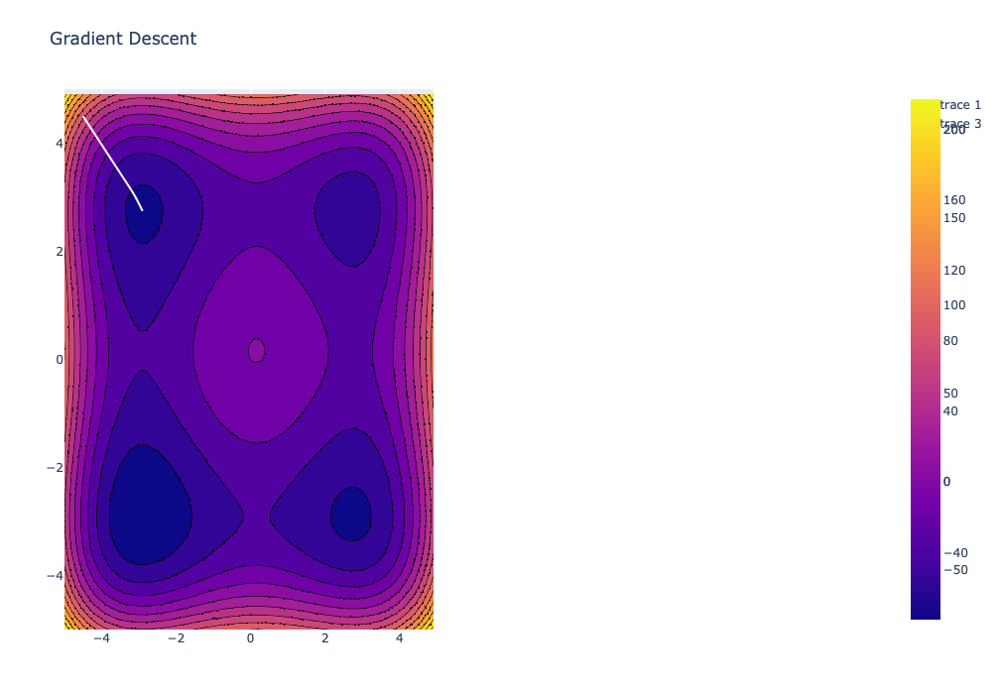

In [45]:
model_1.plot("Gradient Descent", save_3d=False)

#### Gradient Descent --> It simply descends to the nearest local minima and gets stuck there. It has no way of getting out of a local minima. (Gradient descent has an inherent flaw - it can't escape local minima or saddle points)

/var/folders/4x/0d5l4t6s59b1xjz389ty60l00000gn/T/ipykernel_2488/795945214.py:147: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



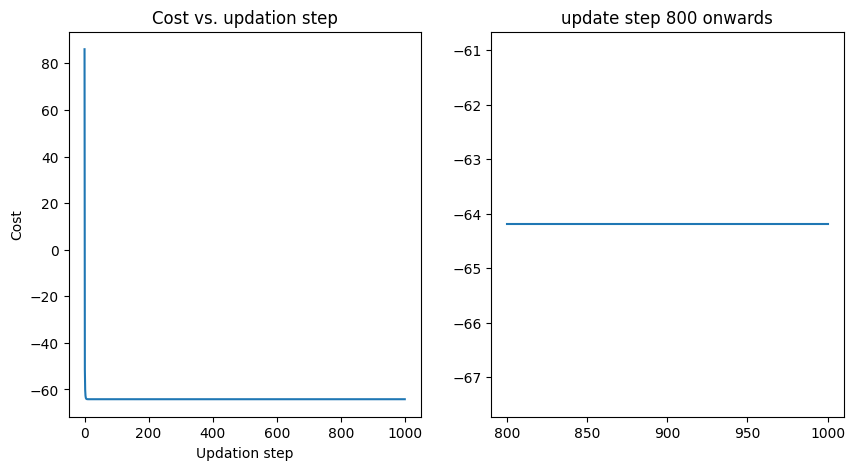

In [7]:
model_1.plot("Gradient Descent", plot_3d=False, plot_hist=True, onwards=800)

# Momentum

In [8]:
model_2 = Model(x_init=-4.5, y_init=4.5)

In [42]:
model_2.fit(alpha=0.005, num_iters=1000, optimizer="Momentum", hyperparameters=(0.98,))

At iteration 100:
	 z: -73.27800041674702
	 x: -2.4171270351036895
	 y: -3.193897956942063
At iteration 200:
	 z: -77.75323792426586
	 x: -2.9212308155645115
	 y: -2.7154568115300695
At iteration 300:
	 z: -77.92432999454108
	 x: -2.9913421164081555
	 y: -3.026133824164991
At iteration 400:
	 z: -78.3071311074415
	 x: -2.86965319798152
	 y: -2.8855215188733716
At iteration 500:
	 z: -78.32928253308769
	 x: -2.899326672849386
	 y: -2.890911839768459
At iteration 600:
	 z: -78.33136042065782
	 x: -2.908929517158735
	 y: -2.908724676739263
At iteration 700:
	 z: -78.33231930692054
	 x: -2.9028430676340613
	 y: -2.9040056740418407
At iteration 800:
	 z: -78.33231501254974
	 x: -2.902975774668494
	 y: -2.9027360714970762
At iteration 900:
	 z: -78.33233032640119
	 x: -2.9037533753701066
	 y: -2.903654056331499
At iteration 999:
	 z: -78.3323313718834
	 x: -2.903517941146108
	 y: -2.903576494753304
At iteration 1000:
	 z: -78.33233129177577
	 x: -2.9035577799913748
	 y: -2.903612326441247
Ti

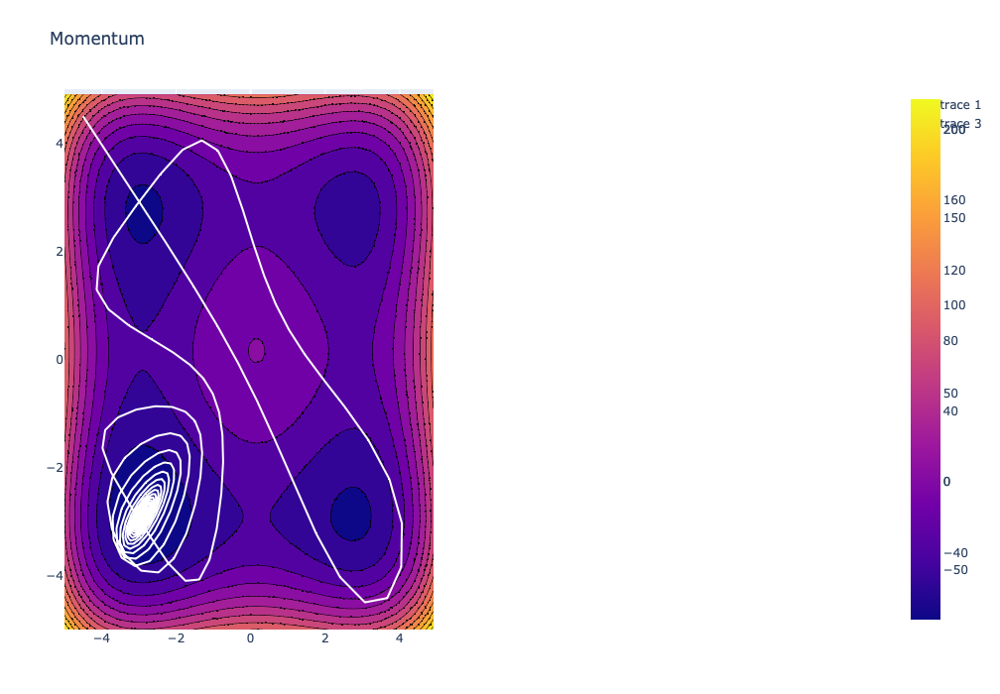

In [46]:
model_2.plot(title="Momentum", save_3d=False)

#### Momentum --> This was the best I was able to get out of momentum by tuning the hyperparameters. Though it reaches the global minima, it does so quite noisily and moves around all over the place. (Not optimal)

/var/folders/4x/0d5l4t6s59b1xjz389ty60l00000gn/T/ipykernel_2488/795945214.py:147: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



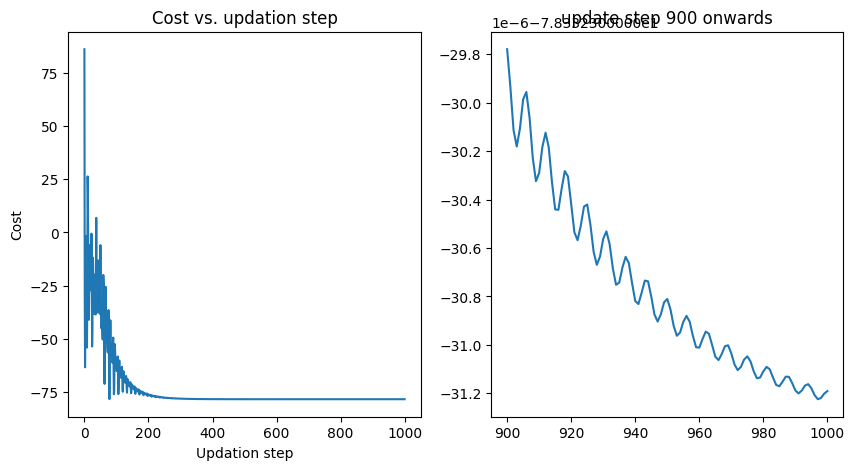

In [11]:
model_2.plot(title="Momentum", plot_3d=False, plot_hist=True, onwards=900)

# AdaGrad

In [12]:
model_3 = Model(x_init=-4.5, y_init=4.5)

In [13]:
model_3.fit(alpha=1.5, num_iters=1500, optimizer="AdaGrad", hyperparameters=(0.95, 1e-08))

At iteration 150:
	 z: -64.19561235905536
	 x: -2.9035340277711774
	 y: 2.7468027709908376
At iteration 300:
	 z: -64.19561235905536
	 x: -2.9035340277711774
	 y: 2.7468027709908376
At iteration 450:
	 z: -64.19561235905536
	 x: -2.9035340277711774
	 y: 2.7468027709908376
At iteration 600:
	 z: -64.19561235905536
	 x: -2.9035340277711774
	 y: 2.7468027709908376
At iteration 750:
	 z: -64.19561235905536
	 x: -2.9035340277711774
	 y: 2.7468027709908376
At iteration 900:
	 z: -64.19561235905536
	 x: -2.9035340277711774
	 y: 2.7468027709908376
At iteration 1050:
	 z: -64.19561235905536
	 x: -2.9035340277711774
	 y: 2.7468027709908376
At iteration 1200:
	 z: -64.19561235905536
	 x: -2.9035340277711774
	 y: 2.7468027709908376
At iteration 1350:
	 z: -64.19561235905536
	 x: -2.9035340277711774
	 y: 2.7468027709908376
At iteration 1499:
	 z: -64.19561235905536
	 x: -2.9035340277711774
	 y: 2.7468027709908376
At iteration 1500:
	 z: -64.19561235905536
	 x: -2.9035340277711774
	 y: 2.74680277099

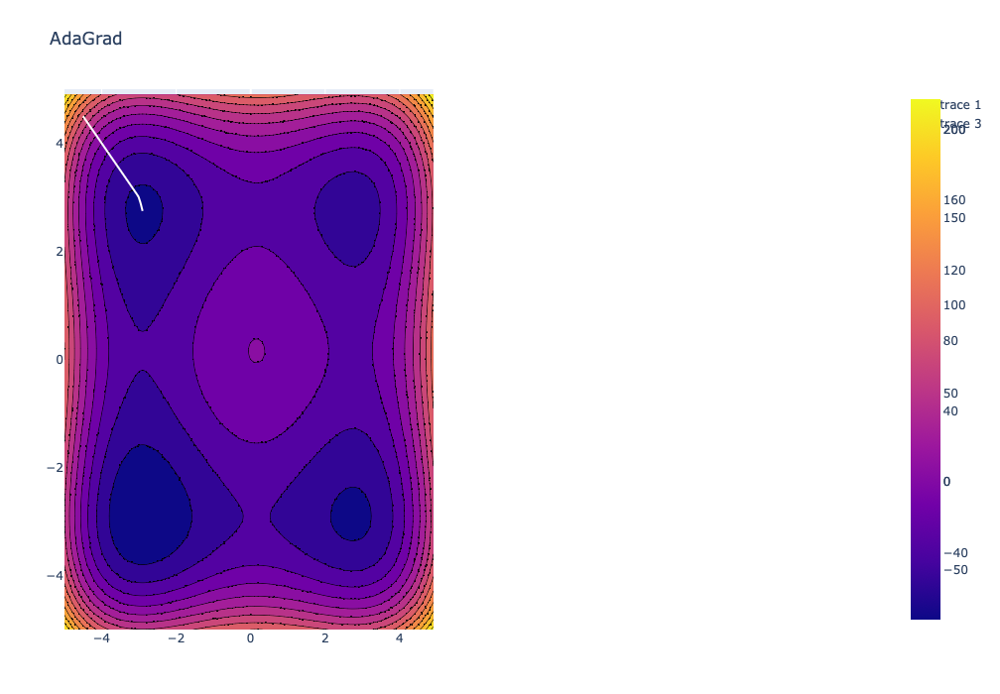

In [14]:
model_3.plot(title="AdaGrad", save_3d=False)

# Adam

In [15]:
model_4 = Model(x_init=-4.5, y_init=4.5)

In [33]:
model_4.fit(alpha=1, num_iters=450, optimizer="Adam", hyperparameters=(0.95, 0.999, 1e-08))

At iteration 45:
	 z: -71.70687162835183
	 x: -3.3723334634020787
	 y: -2.5222202008775976
At iteration 90:
	 z: -78.13727279928789
	 x: -3.0027412967164766
	 y: -2.870062367343515
At iteration 135:
	 z: -78.17509367564827
	 x: -2.8468653414587233
	 y: -2.9796506680397177
At iteration 180:
	 z: -78.31903013673494
	 x: -2.915461634331918
	 y: -2.8784000140064014
At iteration 225:
	 z: -78.33176562273242
	 x: -2.909148719977648
	 y: -2.904599719088553
At iteration 270:
	 z: -78.33218584013372
	 x: -2.9051176520544804
	 y: -2.905963925687788
At iteration 315:
	 z: -78.33231291338791
	 x: -2.9041707842482065
	 y: -2.90434878098571
At iteration 360:
	 z: -78.33233114349318
	 x: -2.9035333307452995
	 y: -2.903657596951225
At iteration 405:
	 z: -78.33233126121897
	 x: -2.903485934122423
	 y: -2.9034556098524393
At iteration 449:
	 z: -78.33233139758416
	 x: -2.903555360461226
	 y: -2.903523034965425
At iteration 450:
	 z: -78.33233140269466
	 x: -2.9035505190627573
	 y: -2.9035369286754906
T

In [48]:
model_4.plot(title='Adam', save_3d=False)

#### Adam --> Adam also behaves quite reliably and tuning its hyperparameters is relatively easy.

/var/folders/4x/0d5l4t6s59b1xjz389ty60l00000gn/T/ipykernel_2488/795945214.py:147: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



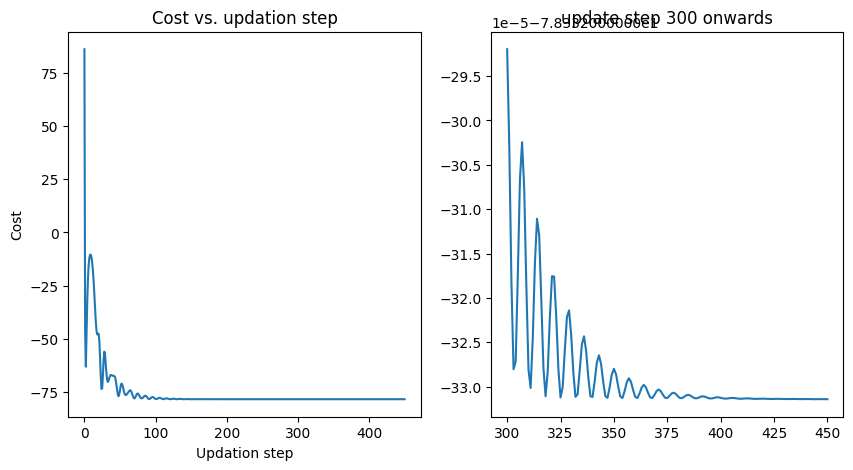

In [36]:
model_4.plot(title="Adam", plot_3d=False, plot_hist=True, onwards=300)

# NAG

In [19]:
model_5 = Model(x_init=-4.5, y_init=4.5)

In [24]:
model_5.fit(alpha=0.007, num_iters=100, optimizer="NAG", hyperparameters=(0.98,))

At iteration 10:
	 z: -43.1096067774171
	 x: -1.7587453019952362
	 y: -1.4762869535086005
At iteration 20:
	 z: -76.38295821070818
	 x: -2.717778220631521
	 y: -2.605134059541124
At iteration 30:
	 z: -78.32725060418545
	 x: -2.9124511634673875
	 y: -2.888866488797955
At iteration 40:
	 z: -78.327913179302
	 x: -2.9143012017760306
	 y: -2.9153074625751296
At iteration 50:
	 z: -78.33214534983549
	 x: -2.9050608664907256
	 y: -2.906435649848871
At iteration 60:
	 z: -78.33233014885587
	 x: -2.903270478472732
	 y: -2.903476234242818
At iteration 70:
	 z: -78.33233068618134
	 x: -2.903406171554678
	 y: -2.9033747403935912
At iteration 80:
	 z: -78.33233139284393
	 x: -2.903523351147181
	 y: -2.903506896956009
At iteration 90:
	 z: -78.33233140703229
	 x: -2.9035385463208123
	 y: -2.9035370458952086
At iteration 99:
	 z: -78.33233140744699
	 x: -2.9035351659904793
	 y: -2.903536088697772
At iteration 100:
	 z: -78.33233140744282
	 x: -2.903535426515597
	 y: -2.903535984170837
Time taken: 0

In [47]:
model_5.plot(title='NAG', save_3d=False)

#### NAG --> NAG seems to perform the best. Also, it is using the same hyperparameters as momentum, but it shows a much more mature behaviour. The NAG algorithm is just a small improvement over the momentum algorithm, but the difference is huge in this case.